In [7]:
import shutil
import pandas as pd
import numpy as np
from bifacial_peak_shaving import *
from data_processing import *
pd.options.plotting.backend='plotly'

# Data

In [8]:
#data_dir = r'~/OneDrive/Data'
data_dir = r'C:/Users/Admin/OneDrive - Politecnico di Milano/Data'

output_filename_stub = r'Output/caltech_ev_mjw8_solar2x__output__'

## Load

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 29184 entries, 2018-05-01 00:00:00 to 2019-02-28 23:45:00
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Load (kW)  29184 non-null  float64
dtypes: float64(1)
memory usage: 456.0 KB
None
          Load (kW)
count  29184.000000
mean      21.240250
std       20.452856
min        0.000000
25%        4.942236
50%       14.632581
75%       33.154909
max      117.733400


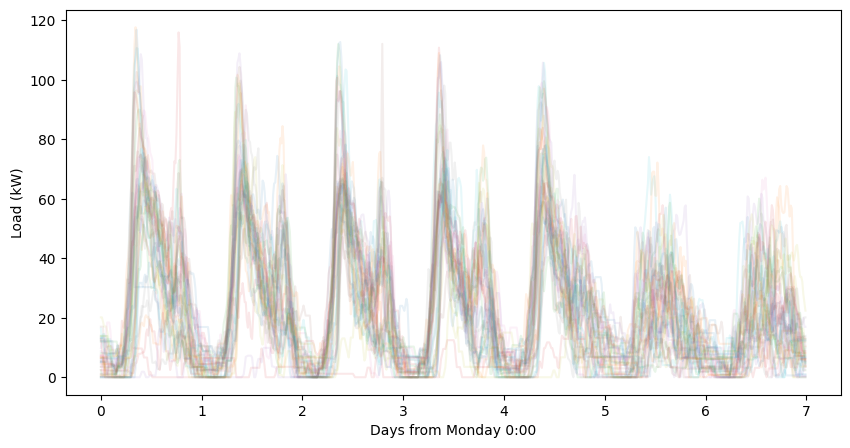

In [9]:
load_file = r'/Load/Vehicle/ACN/old/acn_caltech.csv'

shutil.copyfile(data_dir+load_file, r'./Data/'+load_file.split('/')[-1])

load = pd.read_csv(data_dir + r'/Load/Vehicle/ACN/old/acn_caltech.csv',
                   index_col=0,
                   parse_dates=True,
                   comment='#',)
                    #.resample('1h').mean()\
                    #.fillna(method='ffill')
                    #.loc['2018-4-26':'2019-3-22']
#load = pd.DataFrame({'Load (kW)':list(load.loc['2019-1-2 0:00':'2019-1-2 16:00','Load (kW)'])+list(load.loc[:,'Load (kW)'])},
#                     index=pd.date_range('2019-1-1 0:00',periods=8760,freq='1h'))
#load.loc['2019-5-20'] = load.loc['2019-5-22'].values
#load.loc['2019-5-21'] = load.loc['2019-5-22'].values
#load.index = pd.date_range('1901-1-1 0:00',periods=35040,freq='15min')
load = load.fillna(method='ffill')
#interval_min = int(load.index.to_series().diff().mean().seconds/60)
#load = load.resample('30min').mean()
load = load.loc['2018-5-1':'2019-2-28']
print(load.info())
print(load.describe())
plot_weekly(load['Load (kW)'])
load.plot()

## Solar

- 7 kWp, TMY

- Net zero capacity

  - $capacity[kWp] = production[kWh] \times yield [\frac{kWh}{kWp}]^{-1}$

In [10]:
solar_angles = ['s20','w90','s20w90']

dir_solar = data_dir + r'/Solar/Modelled/'

s20 = pd.concat((pd.read_csv(dir_solar+'pasadena_2018_15min_367mods_s20.csv',index_col=0,parse_dates=True,comment='#'),
                 pd.read_csv(dir_solar+'pasadena_2019_15min_367mods_s20.csv',index_col=0,parse_dates=True,comment='#')))

w90 = pd.concat((pd.read_csv(dir_solar+'pasadena_2018_15min_367mods_w90.csv',index_col=0,parse_dates=True,comment='#'),
                 pd.read_csv(dir_solar+'pasadena_2019_15min_367mods_w90.csv',index_col=0,parse_dates=True,comment='#')))

s20w90 = pd.concat((pd.read_csv(dir_solar+'pasadena_2018_15min_367mods_s20w90.csv',index_col=0,parse_dates=True,comment='#'),
                    pd.read_csv(dir_solar+'pasadena_2019_15min_367mods_s20w90.csv',index_col=0,parse_dates=True,comment='#')))

solar = pd.concat((s20,w90,s20w90),axis=1)
solar.columns=solar_angles

#solar = solar.resample('1h').mean()

solar = solar.loc[load.index] # make same length as load

#net_zero_capacity = load['Load (kW)'].sum() / (solar.s20.sum()) # load=production / yield
#solar = solar * net_zero_capacity # scale to net 0

solar = solar * 2

print(solar.info(),'\n')
print(solar.describe())
solar

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 29184 entries, 2018-05-01 00:00:00 to 2019-02-28 23:45:00
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   s20     29184 non-null  float64
 1   w90     29184 non-null  float64
 2   s20w90  29184 non-null  float64
dtypes: float64(3)
memory usage: 912.0 KB
None 

                s20           w90        s20w90
count  29184.000000  29184.000000  29184.000000
mean      41.576071     35.889766     38.670380
std       57.755871     48.031510     48.759688
min       -0.134586     -0.111746     -0.128214
25%       -0.016309     -0.016309     -0.016309
50%       -0.016309     -0.016309     -0.016309
75%       89.782350     71.577400     88.410350
max      213.666000    174.984800    160.467800


,s20,w90,s20w90
Datetime (PST),,,
2018-05-01 00:00:00,-0.016309,-0.016309,-0.016309
2018-05-01 00:15:00,-0.016309,-0.016309,-0.016309
2018-05-01 00:30:00,-0.016309,-0.016309,-0.016309
2018-05-01 00:45:00,-0.016309,-0.016309,-0.016309
2018-05-01 01:00:00,-0.016309,-0.016309,-0.016309
...,...,...,...
2019-02-28 22:45:00,-0.016309,-0.016309,-0.016309
2019-02-28 23:00:00,-0.016309,-0.016309,-0.016309
2019-02-28 23:15:00,-0.016309,-0.016309,-0.016309


In [11]:
# for col in solar:
#     plot_daily(solar[col],title=col)#,interval_min=60)

## Net load

In [12]:
solar.index = load.index # seems unnecessary
df = pd.concat((load,solar),axis=1)
df.columns = ['load'] + ['solar_'+x for x in solar.columns]
for angle in solar.columns:
    df[f'netload_{angle}'] = df['load'] - solar[angle]

load v s20

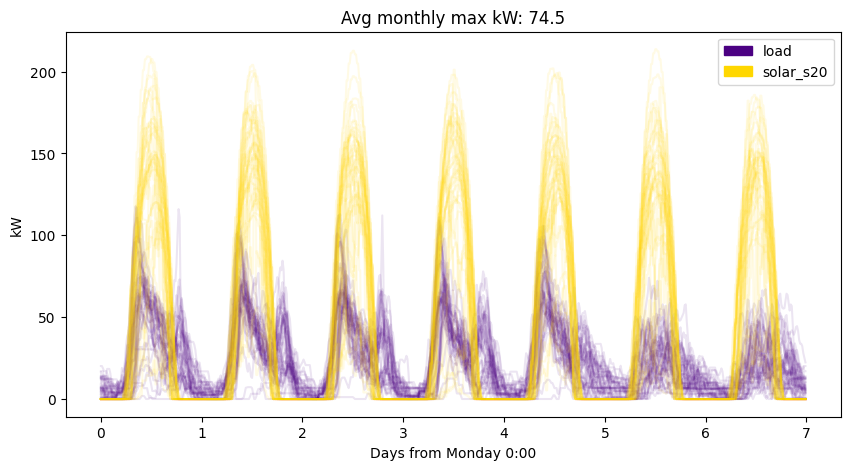

In [13]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

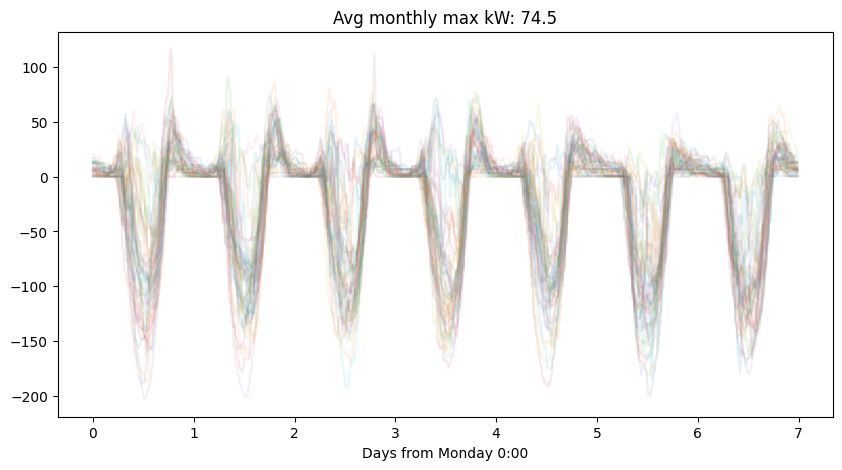

In [14]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w20

In [15]:
# l = df['load']
# s = df['solar_w20']
# avg_monthly_max = (l - s).resample('1M').max().mean()  
# plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

In [16]:
# l = df['load']
# s = df['solar_w20']
# avg_monthly_max = (l - s).resample('1M').max().mean()  
# plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w90

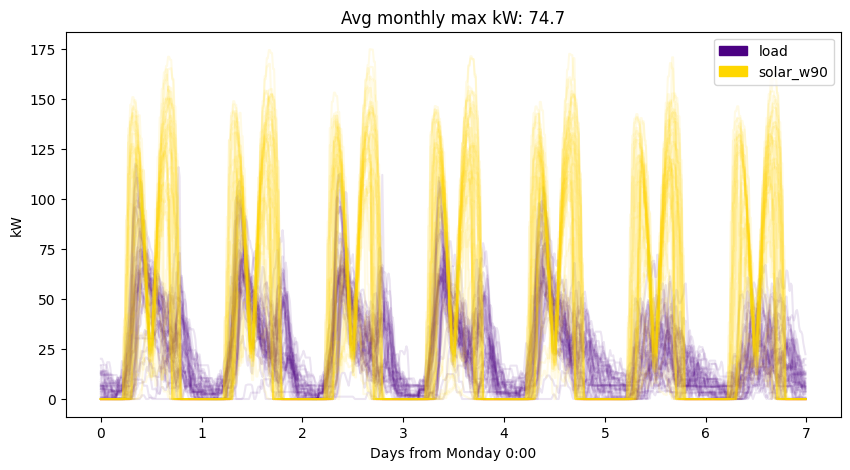

In [17]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

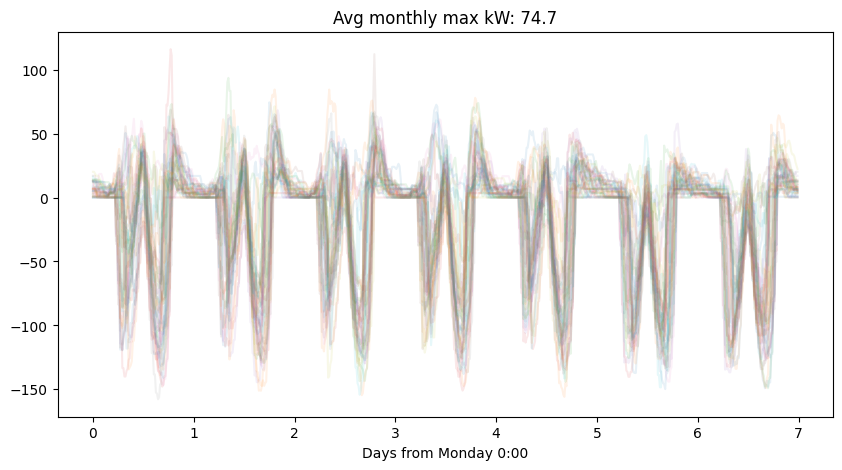

In [18]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v s20w90

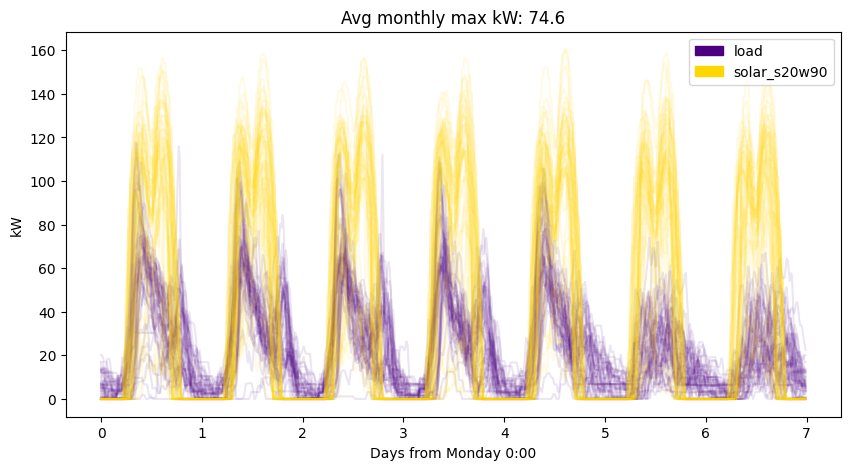

In [19]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

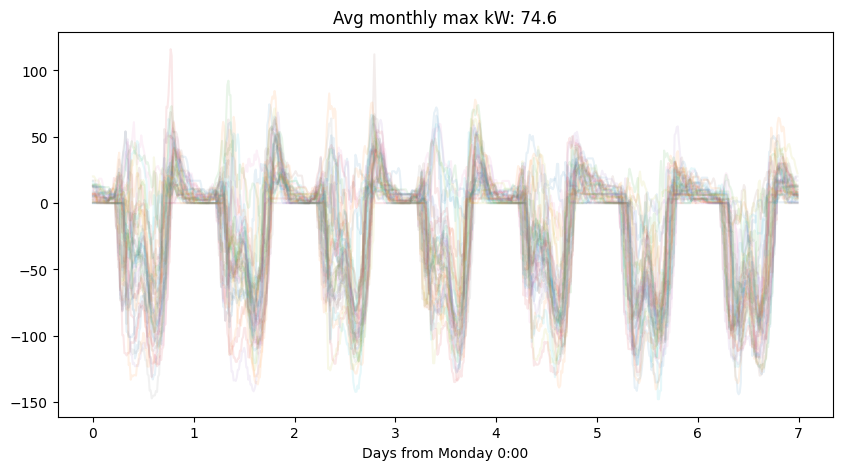

In [20]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

# Baseline costs

Load only, and net load given various solar

In [21]:
real_TOU = [  {'price':26.07, 'hours':list(range(24)) },
              {'price': 6.81, 'hours':list(range(14,16))+list(range(21,23))},
              {'price':32.90, 'hours':list(range(16,21))}]

In [22]:
all_cost = {}

# # load
# cost = 0
# for year in df.index.year.unique():
#     df_year = df[df.index.year==year]
#     for month in df_year.index.month.unique():
#         df_month = df_year[df_year.index.month==month]
#         cost += calc_power_cost(df_month['load'],real_TOU)
# all_cost['load'] = round(cost,0)

# # net load for each solar case

load_cols = ['load'] + [f'netload_{angle}' for angle in solar_angles]

for load_col in load_cols:
    cost = 0
    for year in df.index.year.unique():
        df_year = df[df.index.year==year]
        for month in df_year.index.month.unique():
            df_month = df_year[df_year.index.month==month]
            cost += calc_power_cost(df_month[load_col],real_TOU)
    all_cost[load_col] = round(cost,0)

all_cost

{'load': 44467.0,
 'netload_s20': 36148.0,
 'netload_w90': 36283.0,
 'netload_s20w90': 36236.0}

# Monthly peaks

## Single TOU

In [23]:
df

,load,solar_s20,solar_w90,solar_s20w90,netload_s20,netload_w90,netload_s20w90
Datetime (PST),,,,,,,
2018-05-01 00:00:00,3.013458,-0.016309,-0.016309,-0.016309,3.029767,3.029767,3.029767
2018-05-01 00:15:00,3.013458,-0.016309,-0.016309,-0.016309,3.029767,3.029767,3.029767
2018-05-01 00:30:00,3.013458,-0.016309,-0.016309,-0.016309,3.029767,3.029767,3.029767
2018-05-01 00:45:00,3.013458,-0.016309,-0.016309,-0.016309,3.029767,3.029767,3.029767
2018-05-01 01:00:00,3.013458,-0.016309,-0.016309,-0.016309,3.029767,3.029767,3.029767
...,...,...,...,...,...,...,...
2019-02-28 22:45:00,4.867047,-0.016309,-0.016309,-0.016309,4.883357,4.883357,4.883357
2019-02-28 23:00:00,4.867047,-0.016309,-0.016309,-0.016309,4.883357,4.883357,4.883357
2019-02-28 23:15:00,4.867047,-0.016309,-0.016309,-0.016309,4.883357,4.883357,4.883357


In [24]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)
peaks

,netload_s20 kw,netload_s20 t
0,50.6,2018-05-11 08:00:00
1,28.1,2018-06-06 08:15:00
2,65.7,2018-07-06 10:00:00
3,44.2,2018-08-27 08:15:00
4,61.5,2018-09-05 08:45:00
5,90.9,2018-10-09 08:15:00
6,58.8,2018-11-29 09:45:00
7,71.7,2018-12-06 09:45:00
8,60.5,2019-01-14 09:45:00
9,65.2,2019-02-14 09:45:00


In [25]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)

# angle = 'w20'
# peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
# peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 'w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 's20w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

#print('Avg w20 reduction',peaks['netload_s20->w20 reduc kw'].mean())
print('Avg w90 reduction',peaks['netload_s20->w90 reduc kw'].mean())
print('Avg s20w90 reduction',peaks['netload_s20->s20w90 reduc kw'].mean())
peaks

Avg w90 reduction 0.8000000000000036
Avg s20w90 reduction 1.1200000000000023


,netload_s20 kw,netload_s20 t,netload_w90 kw,netload_w90 t,netload_s20->w90 reduc kw,netload_s20w90 kw,netload_s20w90 t,netload_s20->s20w90 reduc kw
0,50.6,2018-05-11 08:00:00,52.4,2018-05-11 08:00:00,-1.8,51.6,2018-05-11 08:00:00,-1.0
1,28.1,2018-06-06 08:15:00,33.5,2018-06-06 08:15:00,-5.4,30.9,2018-06-06 08:15:00,-2.8
2,65.7,2018-07-06 10:00:00,34.6,2018-07-18 10:00:00,31.1,42.6,2018-07-06 10:00:00,23.1
3,44.2,2018-08-27 08:15:00,47.8,2018-08-27 08:15:00,-3.6,46.1,2018-08-27 08:15:00,-1.9
4,61.5,2018-09-05 08:45:00,65.8,2018-09-05 08:45:00,-4.3,63.8,2018-09-05 08:45:00,-2.3
5,90.9,2018-10-09 08:15:00,93.6,2018-10-09 08:15:00,-2.7,92.3,2018-10-09 08:15:00,-1.4
6,58.8,2018-11-29 09:45:00,60.5,2018-11-29 09:45:00,-1.7,59.6,2018-11-29 09:45:00,-0.8
7,71.7,2018-12-06 09:45:00,72.6,2018-12-06 09:45:00,-0.9,72.1,2018-12-06 09:45:00,-0.4
8,60.5,2019-01-14 09:45:00,61.6,2019-01-14 09:45:00,-1.1,61.0,2019-01-14 09:45:00,-0.5
9,65.2,2019-02-14 09:45:00,66.8,2019-02-14 09:45:00,-1.6,66.0,2019-02-14 09:45:00,-0.8


## Variable TOU

w20

In [26]:
# angle1 = 's20'
# angle2 = 'w20'

# peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
# peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.1]

w90

In [27]:
angle1 = 's20'
angle2 = 'w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>5]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
53,13,18,16.8,5.2,-3.6
54,13,19,44.0,5.5,-1.6
59,14,18,50.6,8.4,-5.5
60,14,19,44.0,5.5,-1.6
63,15,17,34.3,5.8,-3.4
64,15,18,50.6,9.4,-1.6
65,15,19,44.0,5.8,-1.6
68,16,18,50.6,9.7,-0.6
69,16,19,44.0,6.0,0.0
72,17,19,44.0,5.6,0.0


s20w90

In [28]:
angle1 = 's20'
angle2 = 's20w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>5]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
29,10,18,27.6,5.9,-1.8
46,12,18,27.6,5.5,-1.9
53,13,18,27.6,5.6,-1.8
59,14,18,27.6,5.5,-2.8
64,15,18,27.6,6.0,-0.8
68,16,18,27.6,6.2,-0.3


Best for w90

In [29]:
#df.loc['2022-6-28':'2022-6-30'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

In [30]:
#df.loc['2022-3-5':'2022-3-7'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

Largest spread w90 v s20w90

In [31]:
#df.loc['2022-10-12':'2022-10-14'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

# Peak shaving

In [32]:
angle = 's20'
thresholds = (21.563, 21.563, 0.0)#(21.563, 21.563, 0.0)

batt_kwh = 100
TOU = [{'price':26.07, 'hours':list(range(24)) },
       {'price':6.81,  'hours':list(range(14,16))+list(range(18,23))},
       {'price':32.90, 'hours':list(range(16,18))}]
fail,dispatch = peak_shaving_sim(  df[['load',f'solar_{angle}',f'netload_{angle}']]\
                                   .loc['2018-6'],
                                   f'netload_{angle}',
                                   batt_kwh,
                                   thresholds,
                                   TOU,
                                   utility_chg_max=batt_kwh,)

cost = calc_power_cost(dispatch.utility,TOU)

plotly_stacked( dispatch.drop(columns=['soc']),
                solar=f'solar_{angle}',
                threshold0=thresholds[0], threshold0_h=TOU[0]['hours'],                     
                threshold1=thresholds[1], threshold1_h=TOU[1]['hours'],
                threshold2=thresholds[2], threshold2_h=TOU[2]['hours'],                                
                title=f'Cost {cost:.1f} ' + {True:'- Failure',False:''}[fail],
                size=(800,400),
                #upsample_min=1,
                )

```
angle                           w90
batt kwh                        800
total cost               -24.995047
2018-5          (2.232, 2.232, 0.0)
2018-6              (0.0, 0.0, 0.0)
2018-7              (0.0, 0.0, 0.0)
2018-8              (6.0, 0.0, 0.0)
2018-9              (0.0, 0.0, 0.0)
2018-10       (8.959, 8.931, 0.001)
2018-11             (0.0, 0.0, 0.0)
2018-12         (0.809, 0.809, 0.0)
2019-1          (8.228, 7.918, 0.0)
2019-2              (0.0, 0.0, 0.0)
```

In [63]:
angle = 'w90'
yearmonth = '2018-8'
thresholds = (6.0,0.0,0) # (13.03, 19.371, 0.0)

batt_kwh = 800
TOU = [{'price':26.07, 'hours':list(range(24)) },
       {'price':6.81,  'hours':list(range(14,16))+list(range(18,23))},
       {'price':32.90, 'hours':list(range(16,18))}]
fail,dispatch = peak_shaving_sim(  df[['load',f'solar_{angle}',f'netload_{angle}']]\
                                   .loc[yearmonth],
                                   f'netload_{angle}',
                                   batt_kwh,
                                   thresholds,
                                   TOU,
                                   utility_chg_max=batt_kwh,)

cost = calc_power_cost(dispatch.utility,TOU)

plotly_stacked( dispatch.drop(columns=['soc']),
                solar=f'solar_{angle}',
                threshold0=thresholds[0], threshold0_h=TOU[0]['hours'],                     
                threshold1=thresholds[1], threshold1_h=TOU[1]['hours'],
                threshold2=thresholds[2], threshold2_h=TOU[2]['hours'],                                
                title=f'Cost {cost:.1f} ' + {True:'- Failure',False:''}[fail],
                size=(800,400),
                #upsample_min=1,
                )

## Minimize cost

Grid search rough, fine, and gradient descent

In [28]:
TEST = False

TOU = [{'price':26.07,      'hours':list(range(24)) },
       {'price': 6.81,      'hours':list(range(14,16))+list(range(18,23))},
       {'price':32.90,      'hours':list(range(16,18))}]

batt_kwhs = [25,50,75,100,125,150]
angles = ['s20','w90','s20w90']
year_months = [f'{y}-{m}' for y in df.index.year.unique() for m in df.loc[str(y)].index.month.unique()]

if TEST == True: angles, batt_kwhs, year_months = angles[:1], batt_kwhs[:1], year_months[:1]

rough_search_max = 100
rough_step = 10

tic = pd.Timestamp.now()

output = pd.DataFrame([],columns=['angle','batt kwh','total cost']+year_months)
for batt_kwh in batt_kwhs:
    for angle in angles:
        best_monthly = pd.DataFrame([],columns=['year-month','threshold0','threshold1','threshold2','cost'])
        for year_month in year_months:
            _df = df.loc[year_month][['load',f'solar_{angle}',f'netload_{angle}']]
            t_newmonth = pd.Timestamp.now()
            print(f'\n{t_newmonth} Angle {angle} batt_kwh {batt_kwh } begin new month {year_month}')
            
            r = pd.DataFrame([], columns=['i','fail','th0','th1','th2','c','deltac','dc'])
            
            #
            # Rough grid search
            #
            
            k = 0
            for th0 in range(0,rough_search_max,rough_step):
                for th1 in range(0,rough_search_max,rough_step):
                    th1 = min(th0,th1)
                    for th2 in range(0,rough_search_max,rough_step):
                        k += 1
                        fail,dispatch = peak_shaving_sim(   _df,
                                                            f'netload_{angle}',
                                                            batt_kwh,
                                                            [th0,th1,th2],
                                                            TOU,
                                                            utility_chg_max=batt_kwh,)                
                        #if fail == False:
                        cost = calc_power_cost(dispatch.utility,TOU)
                        r.loc[len(r)] = [k,fail,th0,th1,th2,cost,pd.NA,pd.NA]
            
            if len(r) > 0:
                best_cost = r[r.fail==False]['c'].min()
                imin = r[r.fail==False]['c'].idxmin()
                best_th0 = r.loc[imin].th0
                best_th1 = r.loc[imin].th1
                best_th2 = r.loc[imin].th2
            else: 
                print(f'\n\n\n /// No viable solutions for angle {angle} batt_kwh {batt_kwh} year-month {year_month} rough_search_max {rough_search_max}/// \n\n\n')
                break
            
            t_rgs = pd.Timestamp.now()
            dt = (t_rgs - t_newmonth).seconds
            print(f'{t_rgs} (+{dt}s) Rough grid search done for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')


            #
            # Fine grid search
            #

            for th0 in range(max(0,int(best_th0-rough_step)),int(best_th0+rough_step+1),3):
                for th1 in range(max(0,int(best_th1-rough_step)),int(best_th1+rough_step+1),3):
                    th1 = min(th0,th1)
                    for th2 in range(max(0,int(best_th2-rough_step)),int(best_th2+rough_step)):                        
                        k += 1
                        fail,dispatch = peak_shaving_sim(   _df,
                                                            f'netload_{angle}',
                                                            batt_kwh,
                                                            [th0,th1,th2],
                                                            TOU,
                                                            utility_chg_max=batt_kwh,)                
                        #if fail == False:
                        cost = calc_power_cost(dispatch.utility,TOU)
                        r.loc[len(r)] = [k,fail,th0,th1,th2,cost,pd.NA,pd.NA]
            
            best_cost = r[r.fail==False]['c'].min()
            imin = r[r.fail==False]['c'].idxmin()
            best_th0 = r.loc[imin].th0
            best_th1 = r.loc[imin].th1
            best_th2 = r.loc[imin].th2
            
            t_fgs = pd.Timestamp.now()
            dt = (t_fgs - t_rgs).seconds
            print(f'{t_fgs} (+{dt}s) Fine grid search done for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')
            
            #
            # Gradient descent
            #                

            LR = (0.1,0.1,0.1)
            
            c = []
            th = [[best_th0,best_th1,best_th2]]
            cost,fail,dispatch = f(th[0],_df,angle,batt_kwh,TOU)
            c.append(cost)
            
            #final_countdown = 20
            cmin = cost
            patience_counter = 0
            for i in range(1,500):
                dc = grad_f(th[i-1],_df,angle,batt_kwh,TOU)                     # dy
                dth = [(dx+nz)*lr for dx,lr,nz in zip(dc,LR,np.random.rand(3))] # dx
                new_th = [max(0,x+dx) for x,dx in zip(th[i-1],dth)]             # x2 = x1 + dx
                new_th[1] = min(new_th[0],new_th[1])                            # all th1 <= th0
                new_th[2] = min(new_th[0],new_th[2])                            # all th2 <= th1
                th.append(new_th)
                cost,fail,dispatch = f(th[i],_df,angle,batt_kwh,TOU)                  
                c.append(cost)
                
                r.loc[len(r)] = [i+k, # k from rough/fine searches
                                fail,
                                round(th[i][0],3),
                                round(th[i][1],3),
                                round(th[i][2],3),
                                c[i],
                                c[i]-c[i-1],
                                [round(x,3) for x in dc]]
                
                if cost < cmin:
                    cmin = cost
                    patience_counter = 0
                else:
                    patience_counter += 1
                    
                # stopping condition
                if patience_counter >= 50:
                    break

                # stopping conditions
                # if r[['deltac']][k:].dropna().rolling(100).std().iloc[-1,0] > 10:
                #     break
                
                # deltac = r[['deltac']].rolling(100).mean()[k:].dropna()
                # if len(deltac[deltac.deltac > -0.1]) >= 50:
                #     break
                
                # if abs(c[i]-c[i-1])<0.3:
                #     final_countdown -= 1
                    
                # if final_countdown == 0:
                #     break
                                
                
            #
            # Gradient descent small LR
            #                
            
            # LR = (0.01,0.01,0.01)
            
            # print(f'{pd.Timestamp.now()} Gradient descent decrease LR to {LR} for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')
            
            # j = i
            # for i in range(j,j+500):
            #     dc = grad_f(th[i-1])
            #     dth = [(dx+nz)*lr for dx,lr,nz in zip(dc,LR,rnd.rand(3))]
            #     new_th = [max(0,x+dx) for x,dx in zip(th[i-1],dth)]
            #     th.append(new_th)
            #     cost,fail,dispatch = f(th[i])                    
            #     c.append(cost)
                
            #     r.loc[len(r)] = [i+k,
            #                      fail,
            #                      round(th[i][0],3),
            #                      round(th[i][1],3),
            #                      round(th[i][2],3),
            #                      c[i],
            #                      c[i]-c[i-1],
            #                      [round(x,3) for x in dc]]


            best_cost   = r[r.fail==False]['c'].min()
            imin        = r[r.fail==False]['c'].idxmin()
            best_th0    = r.loc[imin].th0
            best_th1    = r.loc[imin].th1
            best_th2    = r.loc[imin].th2
            best_monthly.loc[len(best_monthly)] = [year_month,  best_th0,
                                                                best_th1,
                                                                best_th2,   best_cost]
        
        
            t_gd = pd.Timestamp.now()
            dt = (t_gd - t_fgs).seconds
            print(f'{t_gd} (+{dt}s) Gradient descent done for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')
    
        #best_monthly.index = best_monthly.month
        #best_monthly = best_monthly.drop(columns=['month'])
        
        # print('/// Best monthly')
        # print(f'Batt kwh {batt_kwh}')
        # print(f'Total cost {best_monthly.cost.sum():.1f}')
        # print(best_monthly.T,'\n\n')
        
        
        new_row = [angle, batt_kwh, best_monthly.cost.sum()]
        for th0,th1,th2 in zip(best_monthly.threshold0,best_monthly.threshold1,best_monthly.threshold2):
            new_row.append( (th0,th1,th2) )
        output.loc[len(output)] = new_row
        output.to_csv(output_filename_stub+tic.strftime('%y-%m-%d_%H-%M-%S')+'.csv')
        
# r.loc[r.fail==False,'c'] = r[r.fail==False].c
# r.loc[r.fail==True,'c (fail)'] = r[r.fail==True].c
# r[['c','c (fail)']].plot()
print('Elapsed',pd.Timestamp.now()-tic)


2023-10-24 23:43:18.422924 Angle s20 batt_kwh 25 begin new month 2018-5
2023-10-24 23:43:32.450281 (+14s) Rough grid search done for 2018-5 thresholds=(40.0,40.0,0.0), cost=1315.2 
2023-10-24 23:43:39.816045 (+7s) Fine grid search done for 2018-5 thresholds=(40.0,40.0,0.0), cost=1315.2 
2023-10-24 23:43:47.464105 (+7s) Gradient descent done for 2018-5 thresholds=(40.0,40.0,0.0), cost=1314.0 

2023-10-24 23:43:47.465103 Angle s20 batt_kwh 25 begin new month 2018-6
2023-10-24 23:44:01.364890 (+13s) Rough grid search done for 2018-6 thresholds=(50.0,50.0,0.0), cost=1479.3 
2023-10-24 23:44:09.160970 (+7s) Fine grid search done for 2018-6 thresholds=(46.0,46.0,0.0), cost=1347.7 
2023-10-24 23:44:18.635545 (+9s) Gradient descent done for 2018-6 thresholds=(46.3,43.8,0.4), cost=1273.8 

2023-10-24 23:44:18.637540 Angle s20 batt_kwh 25 begin new month 2018-7
2023-10-24 23:44:32.691991 (+14s) Rough grid search done for 2018-7 thresholds=(60.0,60.0,20.0), cost=2630.8 
2023-10-24 23:44:49.75819

In [34]:
TEST = False

TOU = [{'price':26.07,      'hours':list(range(24)) },
       {'price': 6.81,      'hours':list(range(14,16))+list(range(18,23))},
       {'price':32.90,      'hours':list(range(16,18))}]

batt_kwhs = [100,200,400,600,800]
angles = ['s20','w90','s20w90']
year_months = [f'{y}-{m}' for y in df.index.year.unique() for m in df.loc[str(y)].index.month.unique()]

if TEST == True: angles, batt_kwhs, year_months = angles[:1], batt_kwhs[:1], year_months[:1]

rough_search_max = 100
rough_step = 10

tic = pd.Timestamp.now()

output = pd.DataFrame([],columns=['angle','batt kwh','total cost']+year_months)
for batt_kwh in batt_kwhs:
    for angle in angles:
        best_monthly = pd.DataFrame([],columns=['year-month','threshold0','threshold1','threshold2','cost'])
        for year_month in year_months:
            _df = df.loc[year_month][['load',f'solar_{angle}',f'netload_{angle}']]
            t_newmonth = pd.Timestamp.now()
            print(f'\n{t_newmonth} Angle {angle} batt_kwh {batt_kwh } begin new month {year_month}')
            
            r = pd.DataFrame([], columns=['i','fail','th0','th1','th2','c','deltac','dc'])
            
            #
            # Rough grid search
            #
            
            k = 0
            for th0 in range(0,rough_search_max,rough_step):
                for th1 in range(0,rough_search_max,rough_step):
                    th1 = min(th0,th1)
                    for th2 in range(0,rough_search_max,rough_step):
                        k += 1
                        fail,dispatch = peak_shaving_sim(   _df,
                                                            f'netload_{angle}',
                                                            batt_kwh,
                                                            [th0,th1,th2],
                                                            TOU,
                                                            utility_chg_max=batt_kwh,)                
                        #if fail == False:
                        cost = calc_power_cost(dispatch.utility,TOU)
                        r.loc[len(r)] = [k,fail,th0,th1,th2,cost,pd.NA,pd.NA]
            
            if len(r) > 0:
                best_cost = r[r.fail==False]['c'].min()
                imin = r[r.fail==False]['c'].idxmin()
                best_th0 = r.loc[imin].th0
                best_th1 = r.loc[imin].th1
                best_th2 = r.loc[imin].th2
            else: 
                print(f'\n\n\n /// No viable solutions for angle {angle} batt_kwh {batt_kwh} year-month {year_month} rough_search_max {rough_search_max}/// \n\n\n')
                break
            
            t_rgs = pd.Timestamp.now()
            dt = (t_rgs - t_newmonth).seconds
            print(f'{t_rgs} (+{dt}s) Rough grid search done for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')


            #
            # Fine grid search
            #

            for th0 in range(max(0,int(best_th0-rough_step)),int(best_th0+rough_step+1),3):
                for th1 in range(max(0,int(best_th1-rough_step)),int(best_th1+rough_step+1),3):
                    th1 = min(th0,th1)
                    for th2 in range(max(0,int(best_th2-rough_step)),int(best_th2+rough_step)):                        
                        k += 1
                        fail,dispatch = peak_shaving_sim(   _df,
                                                            f'netload_{angle}',
                                                            batt_kwh,
                                                            [th0,th1,th2],
                                                            TOU,
                                                            utility_chg_max=batt_kwh,)                
                        #if fail == False:
                        cost = calc_power_cost(dispatch.utility,TOU)
                        r.loc[len(r)] = [k,fail,th0,th1,th2,cost,pd.NA,pd.NA]
            
            best_cost = r[r.fail==False]['c'].min()
            imin = r[r.fail==False]['c'].idxmin()
            best_th0 = r.loc[imin].th0
            best_th1 = r.loc[imin].th1
            best_th2 = r.loc[imin].th2
            
            t_fgs = pd.Timestamp.now()
            dt = (t_fgs - t_rgs).seconds
            print(f'{t_fgs} (+{dt}s) Fine grid search done for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')
            
            #
            # Gradient descent
            #                

            LR = (0.1,0.1,0.1)
            
            c = []
            th = [[best_th0,best_th1,best_th2]]
            cost,fail,dispatch = f(th[0],_df,angle,batt_kwh,TOU)
            c.append(cost)
            
            #final_countdown = 20
            cmin = cost
            patience_counter = 0
            for i in range(1,500):
                dc = grad_f(th[i-1],_df,angle,batt_kwh,TOU)                     # dy
                dth = [(dx+nz)*lr for dx,lr,nz in zip(dc,LR,np.random.rand(3))] # dx
                new_th = [max(0,x+dx) for x,dx in zip(th[i-1],dth)]             # x2 = x1 + dx
                new_th[1] = min(new_th[0],new_th[1])                            # all th1 <= th0
                new_th[2] = min(new_th[0],new_th[2])                            # all th2 <= th1
                th.append(new_th)
                cost,fail,dispatch = f(th[i],_df,angle,batt_kwh,TOU)                  
                c.append(cost)
                
                r.loc[len(r)] = [i+k, # k from rough/fine searches
                                fail,
                                round(th[i][0],3),
                                round(th[i][1],3),
                                round(th[i][2],3),
                                c[i],
                                c[i]-c[i-1],
                                [round(x,3) for x in dc]]
                
                if cost < cmin:
                    cmin = cost
                    patience_counter = 0
                else:
                    patience_counter += 1
                    
                # stopping condition
                if patience_counter >= 50:
                    break

                # stopping conditions
                # if r[['deltac']][k:].dropna().rolling(100).std().iloc[-1,0] > 10:
                #     break
                
                # deltac = r[['deltac']].rolling(100).mean()[k:].dropna()
                # if len(deltac[deltac.deltac > -0.1]) >= 50:
                #     break
                
                # if abs(c[i]-c[i-1])<0.3:
                #     final_countdown -= 1
                    
                # if final_countdown == 0:
                #     break
                                
                
            #
            # Gradient descent small LR
            #                
            
            # LR = (0.01,0.01,0.01)
            
            # print(f'{pd.Timestamp.now()} Gradient descent decrease LR to {LR} for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')
            
            # j = i
            # for i in range(j,j+500):
            #     dc = grad_f(th[i-1])
            #     dth = [(dx+nz)*lr for dx,lr,nz in zip(dc,LR,rnd.rand(3))]
            #     new_th = [max(0,x+dx) for x,dx in zip(th[i-1],dth)]
            #     th.append(new_th)
            #     cost,fail,dispatch = f(th[i])                    
            #     c.append(cost)
                
            #     r.loc[len(r)] = [i+k,
            #                      fail,
            #                      round(th[i][0],3),
            #                      round(th[i][1],3),
            #                      round(th[i][2],3),
            #                      c[i],
            #                      c[i]-c[i-1],
            #                      [round(x,3) for x in dc]]


            best_cost   = r[r.fail==False]['c'].min()
            imin        = r[r.fail==False]['c'].idxmin()
            best_th0    = r.loc[imin].th0
            best_th1    = r.loc[imin].th1
            best_th2    = r.loc[imin].th2
            best_monthly.loc[len(best_monthly)] = [year_month,  best_th0,
                                                                best_th1,
                                                                best_th2,   best_cost]
        
        
            t_gd = pd.Timestamp.now()
            dt = (t_gd - t_fgs).seconds
            print(f'{t_gd} (+{dt}s) Gradient descent done for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')
    
        #best_monthly.index = best_monthly.month
        #best_monthly = best_monthly.drop(columns=['month'])
        
        # print('/// Best monthly')
        # print(f'Batt kwh {batt_kwh}')
        # print(f'Total cost {best_monthly.cost.sum():.1f}')
        # print(best_monthly.T,'\n\n')
        
        
        new_row = [angle, batt_kwh, best_monthly.cost.sum()]
        for th0,th1,th2 in zip(best_monthly.threshold0,best_monthly.threshold1,best_monthly.threshold2):
            new_row.append( (th0,th1,th2) )
        output.loc[len(output)] = new_row
        output.to_csv(output_filename_stub+tic.strftime('%y-%m-%d_%H-%M-%S')+'.csv')
        
# r.loc[r.fail==False,'c'] = r[r.fail==False].c
# r.loc[r.fail==True,'c (fail)'] = r[r.fail==True].c
# r[['c','c (fail)']].plot()
print('Elapsed',pd.Timestamp.now()-tic)


2023-10-27 10:46:07.450632 Angle s20 batt_kwh 100 begin new month 2018-5
2023-10-27 10:46:21.679484 (+14s) Rough grid search done for 2018-5 thresholds=(20.0,20.0,0.0), cost=657.6 
2023-10-27 10:46:28.954964 (+7s) Fine grid search done for 2018-5 thresholds=(19.0,19.0,0.0), cost=624.7 
2023-10-27 10:46:40.247664 (+11s) Gradient descent done for 2018-5 thresholds=(18.9,18.9,0.0), cost=623.5 

2023-10-27 10:46:40.248662 Angle s20 batt_kwh 100 begin new month 2018-6
2023-10-27 10:46:54.164325 (+13s) Rough grid search done for 2018-6 thresholds=(20.0,20.0,0.0), cost=492.9 
2023-10-27 10:47:01.340046 (+7s) Fine grid search done for 2018-6 thresholds=(19.0,19.0,0.0), cost=460.0 
2023-10-27 10:47:08.942704 (+7s) Gradient descent done for 2018-6 thresholds=(18.7,18.7,0.1), cost=451.2 

2023-10-27 10:47:08.944329 Angle s20 batt_kwh 100 begin new month 2018-7
2023-10-27 10:47:22.707403 (+13s) Rough grid search done for 2018-7 thresholds=(40.0,40.0,0.0), cost=1315.2 
2023-10-27 10:47:30.294182 (

## Reload results

Small batts

In [38]:
output = pd.read_csv(output_filename_stub+'23-10-24_23-43-18.csv',
                     index_col=0)

output

,angle,batt kwh,total cost,2018-5,2018-6,2018-7,2018-8,2018-9,2018-10,2018-11,2018-12,2019-1,2019-2
0,s20,25,22790.904168,"(39.965, 39.965, 0.0)","(46.258, 43.792, 0.397)","(61.099, 55.403, 10.987)","(85.233, 85.213, 19.228)","(73.844, 60.906, 42.58)","(79.797, 79.788, 79.76)","(39.015, 32.396, 14.767)","(52.461, 28.904, 14.373)","(42.906, 35.055, 10.943)","(44.435, 28.454, 15.003)"
1,w90,25,19334.339995,"(39.968, 39.968, 0.0)","(42.308, 37.029, 15.292)","(52.367, 46.501, 0.349)","(80.0, 80.0, 0.0)","(63.221, 62.769, 19.653)","(79.789, 79.789, 79.789)","(42.812, 35.02, 11.686)","(52.722, 29.121, 8.589)","(45.985, 32.987, 11.378)","(45.882, 26.656, 15.619)"
2,s20w90,25,20603.516245,"(39.96, 39.96, 0.0)","(43.403, 37.027, 14.577)","(53.94, 46.523, 5.018)","(80.0, 80.0, 0.0)","(62.342, 61.494, 29.546)","(79.792, 79.792, 79.682)","(41.824, 34.939, 11.748)","(52.219, 29.482, 11.485)","(45.579, 36.305, 11.027)","(45.031, 27.05, 15.358)"
3,s20,50,16253.576765,"(30.809, 30.809, 0.021)","(32.343, 32.343, 0.353)","(50.1, 50.098, 0.0)","(52.898, 47.63, 0.048)","(61.746, 59.92, 20.836)","(72.589, 72.589, 49.14)","(25.71, 25.71, 3.437)","(38.863, 29.342, 0.021)","(32.27, 32.27, 0.266)","(35.332, 26.327, 3.835)"
4,w90,50,13044.453768,"(30.301, 30.301, 0.023)","(26.766, 26.766, 17.511)","(35.308, 35.308, 0.006)","(37.358, 37.358, 1.276)","(53.495, 53.271, 0.0)","(94.76, 88.317, 14.513)","(29.299, 29.247, 0.012)","(39.337, 30.004, 0.047)","(34.673, 34.575, 0.0)","(36.007, 26.611, 4.478)"
5,s20w90,50,14155.203306,"(30.287, 30.287, 0.009)","(27.058, 27.058, 11.572)","(39.113, 38.295, 0.0)","(38.344, 38.319, 0.01)","(57.559, 55.974, 3.212)","(86.203, 86.203, 25.724)","(26.976, 25.648, 0.0)","(39.194, 29.999, 0.0)","(33.216, 33.155, 0.009)","(35.313, 25.937, 4.151)"
6,s20,75,12553.282484,"(23.937, 23.937, 0.001)","(25.102, 25.102, 0.513)","(42.108, 42.107, 0.004)","(37.637, 37.637, 0.0)","(64.063, 59.515, 1.73)","(74.924, 74.924, 24.377)","(17.075, 16.961, 0.0)","(28.816, 23.017, 0.0)","(27.632, 27.629, 0.0)","(25.926, 22.101, 0.0)"
7,w90,75,9835.006507,"(25.843, 23.178, 0.009)","(17.611, 17.604, 16.178)","(26.681, 26.681, 0.018)","(29.63, 29.63, 2.778)","(41.885, 41.88, 0.052)","(74.618, 74.618, 4.578)","(23.455, 15.734, 0.0)","(29.778, 19.98, 0.0)","(31.566, 31.566, 0.0)","(27.547, 22.965, 0.064)"
8,s20w90,75,10866.506895,"(23.934, 23.592, 0.0)","(19.395, 19.395, 10.659)","(28.528, 28.528, 0.0)","(30.46, 30.46, 0.0)","(45.709, 45.709, 0.027)","(84.75, 84.75, 4.604)","(19.526, 19.451, 0.0)","(29.345, 19.96, 0.028)","(29.565, 29.565, 0.0)","(26.8, 22.92, 0.0)"
9,s20,100,9846.089563,"(18.896, 18.896, 0.0)","(18.686, 18.686, 0.446)","(34.611, 34.611, 0.028)","(30.936, 30.936, 0.01)","(48.014, 48.014, 0.122)","(55.941, 55.941, 21.872)","(12.021, 12.021, 0.009)","(20.698, 18.925, 0.0)","(24.993, 24.993, 0.0)","(18.54, 15.925, 0.0)"


In [39]:
output = output[['angle','batt kwh','total cost']]

batt_sizes = output['batt kwh'].unique()

outS20 = output[output.angle=='s20']
outW90 = output[output.angle=='w90']
outS20W90 = output[output.angle=='s20w90']

results = pd.DataFrame([],index=batt_sizes)

results['s20'] = outS20['total cost'].values.round(0)
results['w90'] = outW90['total cost'].values.round(0)
results['s20w90'] = outS20W90['total cost'].values.round(0)

results['s20->w90 reduction'] = (results.s20 - results.w90)/results.s20
results['s20->w20w90 reduction'] = (results.s20 - results.s20w90)/results.s20

results_small = results.copy()

results_small

,s20,w90,s20w90,s20->w90 reduction,s20->w20w90 reduction
25,22791.0,19334.0,20604.0,0.151683,0.095959
50,16254.0,13044.0,14155.0,0.197490,0.129137
75,12553.0,9835.0,10867.0,0.216522,0.134311
100,9846.0,7374.0,8223.0,0.251066,0.164839
125,7764.0,5603.0,6250.0,0.278336,0.195003
150,6039.0,4250.0,4711.0,0.296241,0.219904


Large batts

In [48]:
output = pd.read_csv(output_filename_stub+'23-10-27_10-46-07.csv',
                     index_col=0)

output.iloc[13,:]

angle                           w90
batt kwh                        800
total cost               -24.995047
2018-5          (2.232, 2.232, 0.0)
2018-6              (0.0, 0.0, 0.0)
2018-7              (0.0, 0.0, 0.0)
2018-8              (6.0, 0.0, 0.0)
2018-9              (0.0, 0.0, 0.0)
2018-10       (8.959, 8.931, 0.001)
2018-11             (0.0, 0.0, 0.0)
2018-12         (0.809, 0.809, 0.0)
2019-1          (8.228, 7.918, 0.0)
2019-2              (0.0, 0.0, 0.0)
Name: 13, dtype: object

In [44]:
output = output[['angle','batt kwh','total cost']]

batt_sizes = output['batt kwh'].unique()

outS20 = output[output.angle=='s20']
outW90 = output[output.angle=='w90']
outS20W90 = output[output.angle=='s20w90']

results = pd.DataFrame([],index=batt_sizes)

results['s20'] = outS20['total cost'].values.round(0)
results['w90'] = outW90['total cost'].values.round(0)
results['s20w90'] = outS20W90['total cost'].values.round(0)

results['s20->w90 reduction'] = (results.s20 - results.w90)/results.s20
results['s20->w20w90 reduction'] = (results.s20 - results.s20w90)/results.s20

results_large = results.iloc[1:,:].copy()

results

,s20,w90,s20w90,s20->w90 reduction,s20->w20w90 reduction
100,9851.0,7371.0,8222.0,0.251751,0.165364
200,3719.0,2847.0,3285.0,0.234472,0.116698
400,1340.0,1080.0,1374.0,0.194030,-0.025373
600,794.0,427.0,828.0,0.462217,-0.042821
800,431.0,-25.0,405.0,1.058005,0.060325


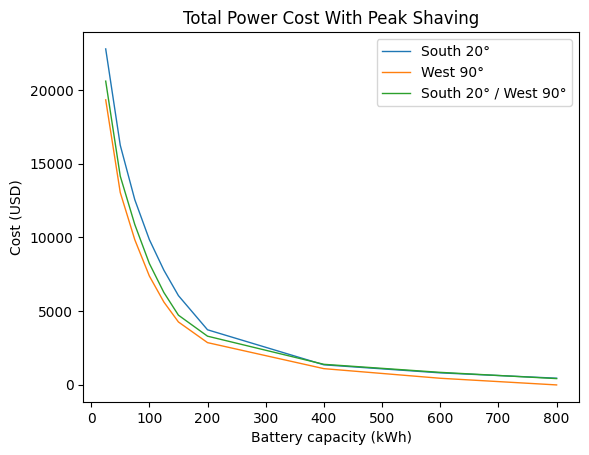

In [42]:
pd.options.plotting.backend='matplotlib'
results = pd.concat((results_small,results_large)).iloc[:,:3]
results.columns = ['South 20°','West 90°','South 20° / West 90°']
results.plot(title='Total Power Cost With Peak Shaving',
             xlabel='Battery capacity (kWh)',
             ylabel='Cost (USD)',
             linewidth=1);

In [45]:
pd.concat((results_small,results_large))

,s20,w90,s20w90,s20->w90 reduction,s20->w20w90 reduction
25,22791.0,19334.0,20604.0,0.151683,0.095959
50,16254.0,13044.0,14155.0,0.197490,0.129137
75,12553.0,9835.0,10867.0,0.216522,0.134311
100,9846.0,7374.0,8223.0,0.251066,0.164839
125,7764.0,5603.0,6250.0,0.278336,0.195003
150,6039.0,4250.0,4711.0,0.296241,0.219904
200,3719.0,2847.0,3285.0,0.234472,0.116698
400,1340.0,1080.0,1374.0,0.194030,-0.025373
600,794.0,427.0,828.0,0.462217,-0.042821
800,431.0,-25.0,405.0,1.058005,0.060325


# Etc

In [ ]:
r[['deltac']][k:].dropna().rolling(100).std().plot()

In [ ]:
r[r.fail==False].loc[k+1:].plot.scatter(x='th0',y='c',color='i',width=800,height=400)

In [ ]:
r[r.fail==False].loc[k+1:].plot.scatter(x='th1',y='c',color='i',width=800,height=400)

In [ ]:
r[r.fail==False].loc[k+1:].plot.scatter(x='th2',y='c',color='i',width=800,height=400)

In [ ]:
r.loc[k+1:][['th0','th1','c']].plot.scatter(x='th0',y='th1',color='c')

In [ ]:
r.loc[k+1:][['th0','th2','c']].plot.scatter(x='th0',y='th2',color='c')

# CF Shape

In [ ]:
import numpy as np

TH0 = np.empty((500,3))
TH0

array([[6.95171738e-310, 6.95171738e-310, 4.68937172e-310],
       [4.68937172e-310, 4.94065646e-324, 4.68937172e-310],
       [4.94065646e-324, 4.68937172e-310, 6.95165821e-310],
       ...,
       [6.95171692e-310, 6.95163184e-310, 6.95171692e-310],
       [6.95163184e-310, 6.95171692e-310, 6.95163184e-310],
       [6.95171692e-310, 6.95163180e-310, 6.95171692e-310]])

In [ ]:
import numpy as np

def shuffle_along_axis(a, axis=0):
    idx = np.random.rand(*a.shape).argsort(axis=axis)
    return np.take_along_axis(a,idx,axis=axis)


th012_values = np.empty((50**3,3))

i = 0
for th0 in [x for x in range(50)]:
    for th1 in [x for x in range(50)]:
        for th2 in [x for x in range(50)]:
            th012_values[i,0] = th0
            th012_values[i,1] = th1
            th012_values[i,2] = th2
            i += 1
            
th012_values = shuffle_along_axis(th012_values)

TH0 =  np.empty(50**3)
TH1 =  np.empty(50**3)
TH2 =  np.empty(50**3)
C =    np.empty(50**3)
FAIL = np.empty(50**3)

angle = 's20'
_df = df.loc[year_month][['load',f'solar_{angle}',f'netload_{angle}']].copy(deep=True)

for i in range(len(th012_values)):
    th0 = th012_values[i,0]
    th1 = th012_values[i,1]
    th2 = th012_values[i,2]

    if (th0>=th1) and (th0>=th2):
        fail,dispatch = peak_shaving_sim(   _df,
                                            f'netload_{angle}',
                                            100,
                                            [th0,th1,th2],
                                            TOU,
                                            utility_chg_max=100,)                
        cost = calc_power_cost(dispatch.utility,TOU)
        TH0[i] = th0
        TH1[i] = th1
        TH2[i] = th2
        C[i] = cost
        FAIL[i] = fail
        #print(i,th0,th1,th2,cost,fail)
    else:
        TH0[i] = th0
        TH1[i] = th1
        TH2[i] = th2
        C[i] = np.nan
        FAIL[i] = np.nan
        #print(i,th0,th1,th2,np.nan,np.nan)

In [ ]:
pd.DataFrame({'th0':TH0,'th1':TH1,'th2':TH2,'c':C,'fail':FAIL}).to_csv('CFshape.csv')

In [ ]:
import plotly.express as px

r = pd.DataFrame({'th0':TH0,'th1':TH1,'th2':TH2,'c':C,'fail':FAIL})

fig = px.scatter_3d(r, x='th0', y='th1', z='c',
              color='c')
fig.show()

In [ ]:
import plotly.express as px

r = pd.DataFrame({'th0':TH0,'th1':TH1,'th2':TH2,'c':C,'fail':FAIL})

fig = px.scatter_3d(r[r.th2==0], x='th0', y='th1', z='c',
              color='c')
fig.show()

In [ ]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np
from scipy.interpolate import griddata


#df = pd.read_csv('./test_data.csv')

rth01 = r[r.th2==0]

x = np.array(rth01.th0)
y = np.array(rth01.th1)
z = np.array(rth01.c)


xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)

X,Y = np.meshgrid(xi,yi)

Z = griddata((x,y),z,(X,Y), method='cubic')

fig = go.Figure(go.Surface(x=xi,y=yi,z=Z))
fig.show()

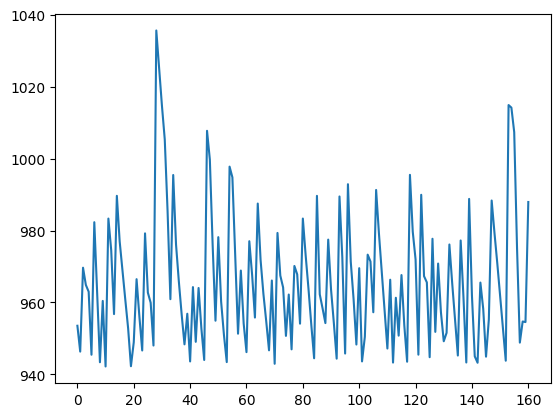

In [ ]:
plt.plot(c)

In [ ]:
r = pd.read_csv('CFshape.csv',index_col=0)
r = r[r.th2==0]
r = r.sort_values(['th0','th1'])
#r = r.sort_values('th1')
r.head(25)

,th0,th1,th2,c,fail
108640,0.0,0.0,0.0,2539.724706,1.0
82092,0.0,2.0,0.0,NaN,NaN
102988,0.0,2.0,0.0,NaN,NaN
82222,0.0,3.0,0.0,NaN,NaN
109015,0.0,3.0,0.0,NaN,NaN
74508,0.0,5.0,0.0,NaN,NaN
116422,0.0,5.0,0.0,NaN,NaN
49728,0.0,7.0,0.0,NaN,NaN
39407,0.0,8.0,0.0,NaN,NaN
85,0.0,9.0,0.0,NaN,NaN


MemoryError: Unable to allocate 4.55 TiB for an array with shape (250000000, 2500) and data type float64

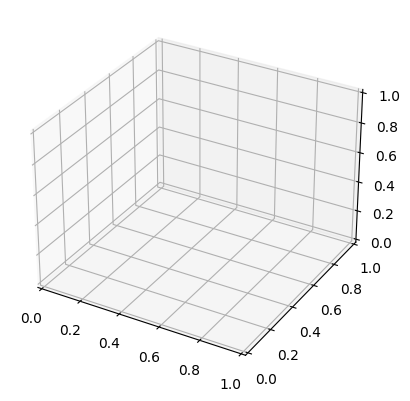

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

from matplotlib import cm
from matplotlib.ticker import LinearLocator

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

r = pd.read_csv('CFshape.csv')

# Make data.
X = np.arange(0, 49, 1)
#X = np.array(r[r.th2==0].th0)
Y = np.arange(0, 49, 1)
#X = np.array(r[r.th2==0].th1)
X, Y = np.meshgrid(X, Y)
#R = np.sqrt(X**2 + Y**2)
#Z = np.sin(R)
Z = np.array(r[r.th2==0].c)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
#ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()